In [17]:
#Importing libraries

import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
#Adjusting the configuration of the plots
matplotlib.rcParams['figure.figsize'] = (12,8) 

In [228]:
#Read data
df = pd.read_csv(r'C:\Users\gcsum\OneDrive\Desktop\movies.csv')

In [230]:
# Peeking in the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [232]:
 #Looking for any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{}-{}%'.format(col,pct_missing))

name-0.0%
rating-0.010041731872717789%
genre-0.0%
year-0.0%
released-0.0002608242044861763%
score-0.0003912363067292645%
votes-0.0003912363067292645%
director-0.0%
writer-0.0003912363067292645%
star-0.00013041210224308815%
country-0.0003912363067292645%
budget-0.2831246739697444%
gross-0.02464788732394366%
company-0.002217005738132499%
runtime-0.0005216484089723526%


In [234]:
#dropping any rows with na values
df = df.dropna()

In [236]:
for col in df.columns:
    prct_null = np.mean(df[col].isnull())
    print('{}%'.format(prct_null))

0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%
0.0%


In [238]:
#Data type of the columns in the data 

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [240]:
#Changing the data type of the columns
df['budget']= df['budget'].astype('int64')

df['gross']= df['gross'].astype('int64')


In [242]:
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime     float64
dtype: object

In [244]:
# remove the country part from the 'released' column
df['released'] = df['released'].str.extract(r'([A-Za-z]+\s\d{1,2},\s\d{4})')

# Convert 'released' column to datetime format
df['released'] = pd.to_datetime(df['released'], format='%B %d, %Y')

# Format the date as 'YYYY-MM-DD'
df['released'] = df['released'].dt.strftime('%Y-%m-%d')

# Checking the result
print(df['released'].head())


0    1980-06-13
1    1980-07-02
2    1980-06-20
3    1980-07-02
4    1980-07-25
Name: released, dtype: object


In [246]:
df['year'] = df['released'].str.extract(r'(d{4})')

In [212]:
df.sort_values(by = ['gross'], inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
5445,Avatar,PG-13,Action,0,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0
7445,Avengers: Endgame,PG-13,Action,0,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0
3045,Titanic,PG-13,Drama,0,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,0,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0
7244,Avengers: Infinity War,PG-13,Action,0,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0
7480,The Lion King,PG,Animation,0,2019-07-19,6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0
6653,Jurassic World,PG-13,Action,0,2015-06-12,7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0
6043,The Avengers,PG-13,Action,0,2012-05-04,8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0
6646,Furious 7,PG-13,Action,0,2015-04-03,7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0
7494,Frozen II,PG,Animation,0,2019-11-22,6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0


In [214]:
pd.set_option('display.max_rows', None)

In [248]:
#Drop any duplicates

df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,NaN,1980-06-13,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,NaN,1980-07-02,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,NaN,1980-06-20,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,NaN,1980-07-02,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,NaN,1980-07-25,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
5,Friday the 13th,R,Horror,NaN,1980-05-09,6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0
6,The Blues Brothers,R,Action,NaN,1980-06-20,7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0
7,Raging Bull,R,Biography,NaN,1980-12-19,8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0
8,Superman II,PG,Action,NaN,1981-06-19,6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0
9,The Long Riders,R,Biography,NaN,1980-05-16,7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0


In [101]:
# Budget's correlation with Gross Revenue
# Company's Correlation with Gross Revenue

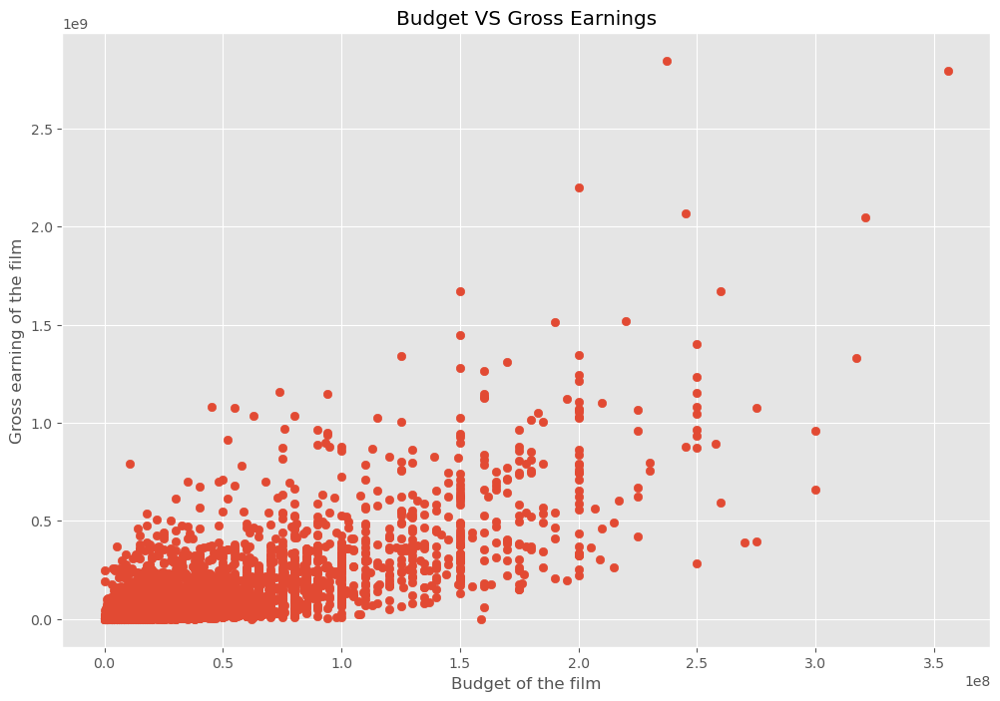

In [250]:
#Scatterplot with budget vs gross

plt.scatter(x= df['budget'], y =df['gross'])
plt.title('Budget VS Gross Earnings')
plt.xlabel('Budget of the film')
plt.ylabel('Gross earning of the film')
plt.show()

<Axes: xlabel='budget', ylabel='gross'>

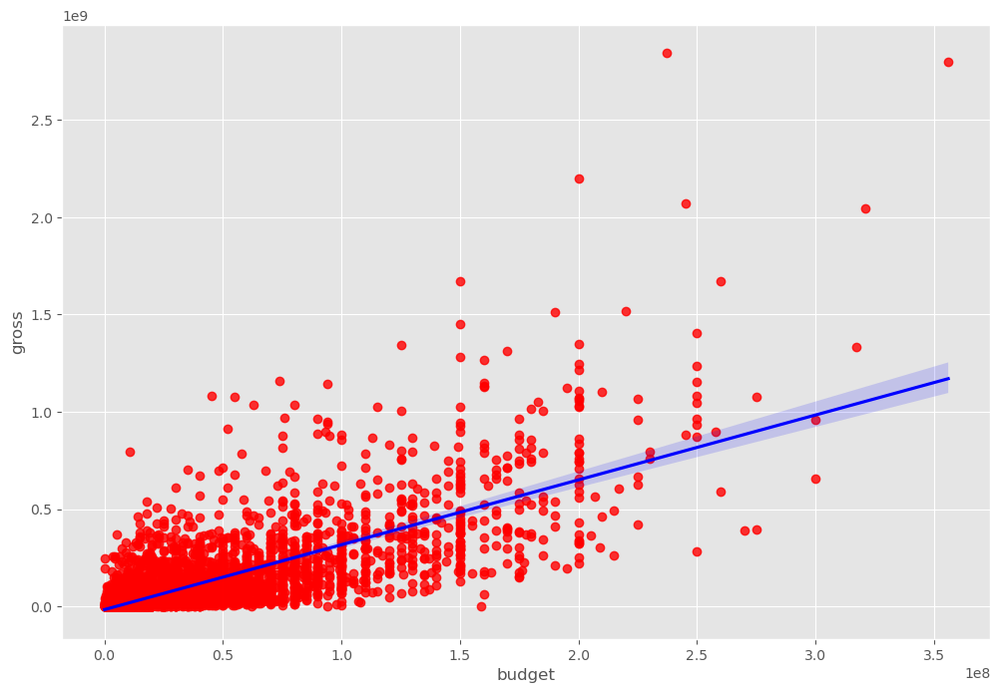

In [252]:
#Plot the budget vs gross using seaborn

sns.regplot(x = 'budget', y ='gross', data=df, scatter_kws={"color":"red"}, line_kws={"color":"blue"})

In [254]:
numeric_df = df.select_dtypes(include=['float', 'int'])
corr_matrix = numeric_df.corr(method='pearson')

In [256]:
corr_matrix

,score,votes,budget,gross,runtime
score,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.414068,0.352303,0.318695,0.275796,1.000000


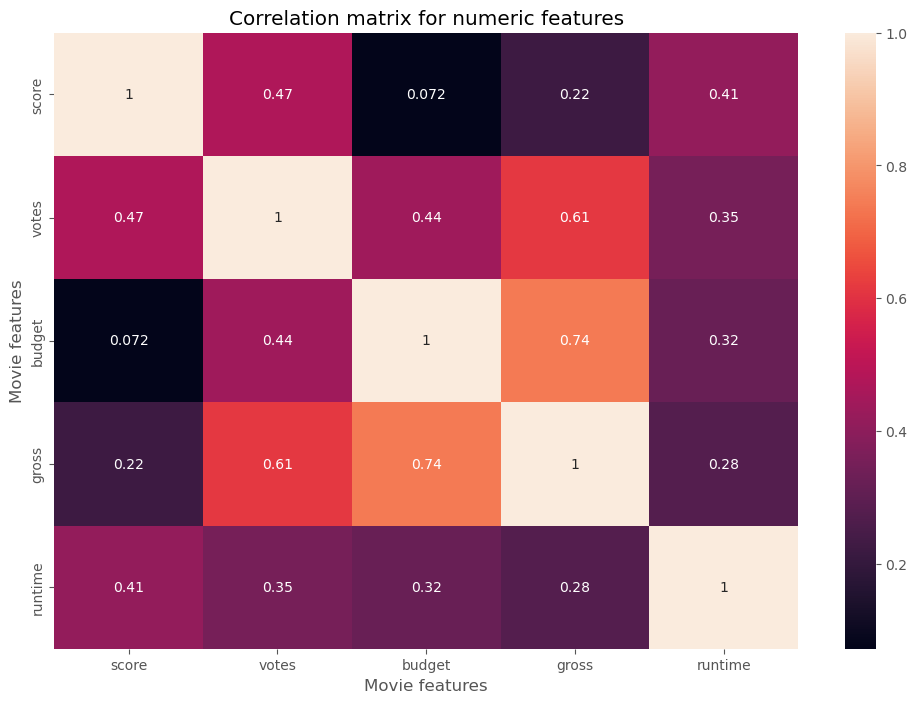

In [258]:
sns.heatmap(corr_matrix, annot= True)
plt.title('Correlation matrix for numeric features')
plt.xlabel('Movie features')
plt.ylabel('Movie features')
plt.show()

In [278]:
#Numberize the companies to 
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object' and col_name != 'year'):
        df_numerized[col_name]= df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

In [280]:
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,4692,6,6,-1,8,8.4,927000.0,1795,2832,699,46,19000000,46998772,1426,146.0
1,3929,6,1,-1,12,5.8,65000.0,1578,1158,214,47,4500000,58853106,452,104.0
2,3641,4,0,-1,9,8.7,1200000.0,757,1818,1157,47,18000000,538375067,945,124.0
3,204,4,4,-1,12,7.7,221000.0,889,1413,1474,47,3500000,83453539,1108,88.0
4,732,6,4,-1,14,7.3,108000.0,719,351,271,47,6000000,39846344,1083,98.0
5,1509,6,9,-1,4,6.4,123000.0,1758,3081,155,47,550000,39754601,1108,95.0
6,3930,6,0,-1,9,7.9,188000.0,974,576,860,47,27000000,115229890,1397,133.0
7,3122,6,3,-1,26,8.2,330000.0,1269,1257,1469,47,18000000,23402427,390,129.0
8,3732,4,0,-1,39,6.8,101000.0,1606,1402,595,47,54000000,108185706,548,127.0
9,4401,6,3,-1,5,7.0,10000.0,2011,280,402,47,10000000,15795189,1391,100.0


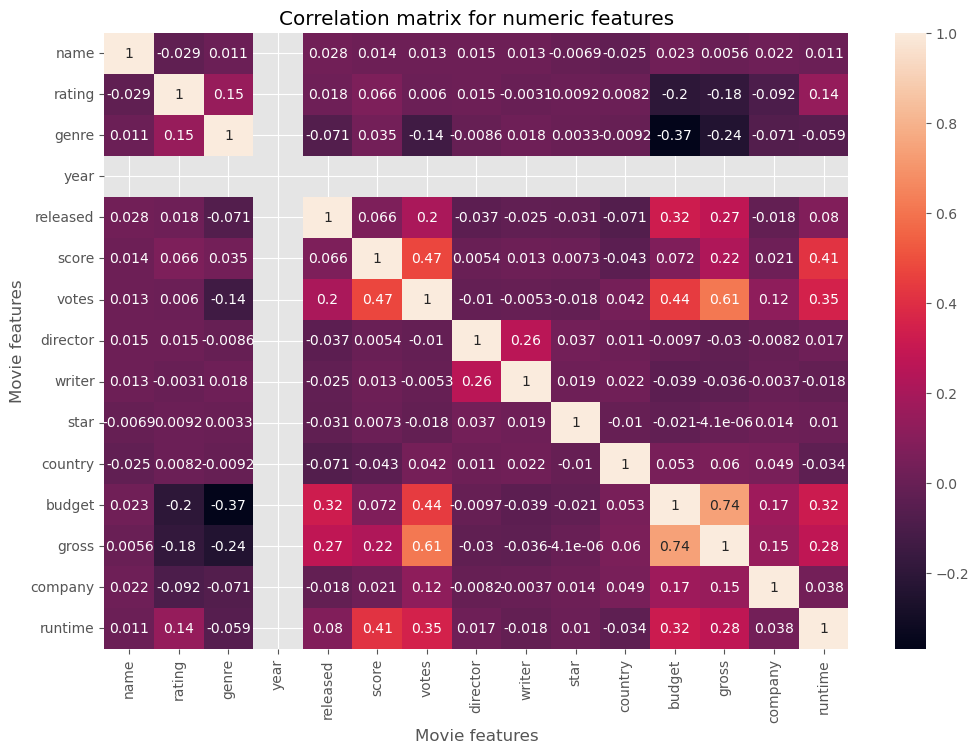

In [282]:
corr_matrix = df_numerized.corr(method='pearson')
sns.heatmap(corr_matrix, annot= True)
plt.title('Correlation matrix for numeric features')
plt.xlabel('Movie features')
plt.ylabel('Movie features')
plt.show()


In [286]:
corr_matrix = df_numerized.corr()

In [292]:
corr_pairs = corr_matrix.unstack()

In [294]:
corr_pairs

name      name        1.000000
          rating     -0.029234
          genre       0.010996
          year             NaN
          released    0.028078
          score       0.014450
          votes       0.012615
          director    0.015246
          writer      0.012880
          star       -0.006882
          country    -0.025490
          budget      0.023392
          gross       0.005639
          company     0.021697
          runtime     0.010850
rating    name       -0.029234
          rating      1.000000
          genre       0.147796
          year             NaN
          released    0.018056
          score       0.065983
          votes       0.006031
          director    0.014656
          writer     -0.003149
          star        0.009196
          country     0.008230
          budget     -0.203946
          gross      -0.181906
          company    -0.092357
          runtime     0.140792
genre     name        0.010996
          rating      0.147796
        

In [300]:
sorted_pairs = corr_pairs.sort_values()

In [302]:
sorted_pairs

genre     budget     -0.368523
budget    genre      -0.368523
gross     genre      -0.244101
genre     gross      -0.244101
budget    rating     -0.203946
rating    budget     -0.203946
gross     rating     -0.181906
rating    gross      -0.181906
genre     votes      -0.135990
votes     genre      -0.135990
rating    company    -0.092357
company   rating     -0.092357
released  country    -0.071457
country   released   -0.071457
company   genre      -0.071334
genre     company    -0.071334
          released   -0.070860
released  genre      -0.070860
genre     runtime    -0.059237
runtime   genre      -0.059237
score     country    -0.043051
country   score      -0.043051
budget    writer     -0.039466
writer    budget     -0.039466
director  released   -0.037166
released  director   -0.037166
writer    gross      -0.035885
gross     writer     -0.035885
runtime   country    -0.034477
country   runtime    -0.034477
released  star       -0.031014
star      released   -0.031014
gross   

In [304]:
high_corr = sorted_pairs[(sorted_pairs)>0.5]

In [306]:
high_corr

gross     votes       0.614751
votes     gross       0.614751
budget    gross       0.740247
gross     budget      0.740247
name      name        1.000000
gross     gross       1.000000
budget    budget      1.000000
country   country     1.000000
star      star        1.000000
writer    writer      1.000000
director  director    1.000000
votes     votes       1.000000
score     score       1.000000
released  released    1.000000
genre     genre       1.000000
rating    rating      1.000000
company   company     1.000000
runtime   runtime     1.000000
dtype: float64

In [310]:
#CONCLUSION:

#VOTE AND BUDGET HAVE THE HIGHEST CORRELATION
#COMPANY HAS LOW CORRELATION